In [45]:
import scanpy as sc
adata = sc.read_h5ad('/home/Data_Drive_8TB_3/kykim/ccRCC/final_merge.h5ad')
print(adata.shape)  # adata.shape는 튜플 형태로 출력됩니다.

(244687, 14073)


In [46]:
import scanpy as sc
Eadata = sc.read_h5ad('/home/Data_Drive_8TB_3/kykim/ccRCC/Epithelial_adata.h5ad')
print(Eadata.shape)  # adata.shape는 튜플 형태로 출력됩니다.

(35716, 2126)


In [47]:
import scanpy as sc
Iadata = sc.read_h5ad('/home/Data_Drive_8TB_3/kykim/ccRCC/Immunocell_adata.h5ad')
print(Iadata.shape)  # adata.shape는 튜플 형태로 출력됩니다.

(51848, 2126)


In [48]:
# Eadata와 adata의 공통 인덱스 찾기
common_obs_indices = Eadata.obs.index.intersection(adata.obs.index)

# Eadata의 var_names를 기준으로 adata의 데이터를 정렬 및 재구성
common_var_names = Eadata.var_names.intersection(adata.var_names)

# adata를 Eadata의 구조에 맞게 재구성
adata_aligned = adata[common_obs_indices, common_var_names].copy()

# Eadata의 var_names 순서에 맞게 정렬
adata_aligned = adata_aligned[:, Eadata.var_names].copy()

# Eadata의 .X에 adata의 데이터를 반영
Eadata_updated = Eadata.copy()
Eadata_updated[common_obs_indices].X = adata_aligned.X.copy()

print("Eadata.X가 adata.X로 성공적으로 업데이트되었습니다.")


Eadata.X가 adata.X로 성공적으로 업데이트되었습니다.


In [49]:
# 저장 경로 지정
save_path = "/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Deconvolution_rar/Epithelial_raw_expression.h5ad"

# AnnData 객체 저장
Eadata_updated.write(save_path)

print(f"Eadata_updated가 성공적으로 저장되었습니다: {save_path}")


FileNotFoundError: [Errno 2] Unable to synchronously create file (unable to open file: name = '/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Deconvolution_rar/Epithelial_raw_expression.h5ad', errno = 2, error message = 'No such file or directory', flags = 13, o_flags = 242)

In [ ]:
Eadata_updated

In [ ]:
# Eadata와 adata의 공통 인덱스 찾기
common_obs_indices = Iadata.obs.index.intersection(adata.obs.index)

# Eadata의 var_names를 기준으로 adata의 데이터를 정렬 및 재구성
common_var_names = Iadata.var_names.intersection(adata.var_names)

# adata를 Eadata의 구조에 맞게 재구성
adata_aligned = adata[common_obs_indices, common_var_names].copy()

# Eadata의 var_names 순서에 맞게 정렬
adata_aligned = adata_aligned[:, Iadata.var_names].copy()

# Eadata의 .X에 adata의 데이터를 반영
Iadata_updated = Iadata.copy()
Iadata_updated[common_obs_indices].X = adata_aligned.X.copy()

print("Iadata.X가 adata.X로 성공적으로 업데이트되었습니다.")


In [ ]:
# 저장 경로 지정
save_path = "/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Deconvolution_rar/Immunecell_raw_expression.h5ad"

# AnnData 객체 저장
Iadata_updated.write(save_path)

print(f"Iadata_updated가 성공적으로 저장되었습니다: {save_path}")


In [ ]:
Iadata_updated.obs

In [ ]:
Iadata_updated.obs['stage'].value_counts()

In [ ]:
list(Iadata_updated.obs['final_labels'].unique())

In [ ]:
N_Immune = Iadata_updated[Iadata_updated.obs['stage'].isin(['normal'])]
S3_Immune = Iadata_updated[Iadata_updated.obs['stage'].isin(['3'])]
S4_Immune = Iadata_updated[Iadata_updated.obs['stage'].isin(['4'])]

In [ ]:
print(N_Immune.obs['stage'].value_counts())
print(S3_Immune.obs['stage'].value_counts())
print(S4_Immune.obs['stage'].value_counts())

In [ ]:
save_path = "/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Immune_Deconvolution/N_Immune.h5ad"

# AnnData 객체 저장
N_Immune.write(save_path)

In [ ]:
save_path = "/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Immune_Deconvolution/S3_Immune.h5ad"

# AnnData 객체 저장
S3_Immune.write(save_path)

In [ ]:
save_path = "/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Immune_Deconvolution/S4_Immune.h5ad"

# AnnData 객체 저장
S4_Immune.write(save_path)

In [ ]:
N_Immune.obs

In [50]:
ccRCC2 = Eadata[Eadata.obs['leiden'] == 'ccRCCccRCC2']

In [51]:
ccRCC2.obs

,patient,stage,exp,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,...,doublet_score,predicted_doublet,leiden,cell_type,cnv_leiden,cnv_score,cnv_status,crg_score,hilpda_score,hypoxia_score
RCC81_AACAACCTCATACAGC-1,RCC81,2,ccRCC,4670,8.449128,24379.0,10.101518,28.549161,39.041798,50.514787,...,0.082581,False,ccRCCccRCC2,Epithelial,20,0.018805,tumor,0.222746,0.643766,0.871619
RCC81_AACCTTTCAGTATGAA-1,RCC81,2,ccRCC,5469,8.607034,33744.0,10.426588,25.237079,36.086415,48.453058,...,0.043643,False,ccRCCccRCC2,Epithelial,37,0.012906,tumor,0.196426,0.567100,1.102069
RCC81_AACCTTTTCTCAGGCG-1,RCC81,2,ccRCC,3234,8.081784,12342.0,9.420844,31.931616,42.391833,53.589370,...,0.040725,False,ccRCCccRCC2,Epithelial,15,0.018060,tumor,0.074420,0.475243,0.608049
RCC81_AAGCGTTGTACAGTTC-1,RCC81,2,ccRCC,3461,8.149602,14478.0,9.580455,31.585854,43.327808,54.876364,...,0.047240,False,ccRCCccRCC2,Epithelial,15,0.018060,tumor,0.205929,0.372824,0.995189
RCC81_AAGTACCTCCAGTTCC-1,RCC81,2,ccRCC,3068,8.029107,10793.0,9.286746,31.853979,42.536829,53.173353,...,0.032440,False,ccRCCccRCC2,Epithelial,24,0.022171,tumor,0.089903,-0.017867,0.745414
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GSM6415694_N2_TTACGTTGTTCCGTTC.1,N2,normal,GSM,521,6.257668,908.0,6.812345,45.044053,53.634361,64.647577,...,0.019076,False,ccRCCccRCC2,Epithelial,3,0.015402,tumor,0.061352,-0.231002,0.320103
GSM6415694_N2_TTATTGCGTATACCCA.1,N2,normal,GSM,468,6.150603,1000.0,6.908755,54.600000,63.200000,73.200000,...,0.014288,False,ccRCCccRCC2,Epithelial,3,0.015402,tumor,0.074417,-0.180623,0.758471
GSM6415694_N2_TTGCCTGTCTCAACGA.1,N2,normal,GSM,808,6.695799,1853.0,7.525101,51.484080,58.014031,67.188343,...,0.017663,False,ccRCCccRCC2,Epithelial,14,0.015643,tumor,0.094945,-0.161627,0.510002
GSM6415694_N2_TTTACGTAGTTACTCG.1,N2,normal,GSM,836,6.729824,1602.0,7.379632,42.571785,49.812734,60.299625,...,0.029618,False,ccRCCccRCC2,Epithelial,35,0.005379,tumor,0.057890,-0.198940,0.066018


In [52]:
# Eadata와 adata의 공통 인덱스 찾기
common_obs_indices = ccRCC2.obs.index.intersection(adata.obs.index)

# Eadata의 var_names를 기준으로 adata의 데이터를 정렬 및 재구성
common_var_names = ccRCC2.var_names.intersection(adata.var_names)

# adata를 Eadata의 구조에 맞게 재구성
adata_aligned = adata[common_obs_indices, common_var_names].copy()

# Eadata의 var_names 순서에 맞게 정렬
adata_aligned = adata_aligned[:, ccRCC2.var_names].copy()

# Eadata의 .X에 adata의 데이터를 반영
ccRCC2_updated = ccRCC2.copy()
ccRCC2_updated[common_obs_indices].X = adata_aligned.X.copy()

print("ccRCC2.X가 adata.X로 성공적으로 업데이트되었습니다.")


ccRCC2.X가 adata.X로 성공적으로 업데이트되었습니다.


In [57]:
ccRCC2_updated.X

array([[0., 1., 1., ..., 2., 0., 0.],
       [0., 5., 4., ..., 0., 0., 0.],
       [0., 0., 0., ..., 7., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [58]:
# 저장 경로 지정
save_path = "/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC2raw.h5ad"

# AnnData 객체 저장
ccRCC2_updated.write(save_path)

print(f"Eadata_updated가 성공적으로 저장되었습니다: {save_path}")


Eadata_updated가 성공적으로 저장되었습니다: /home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC2raw.h5ad


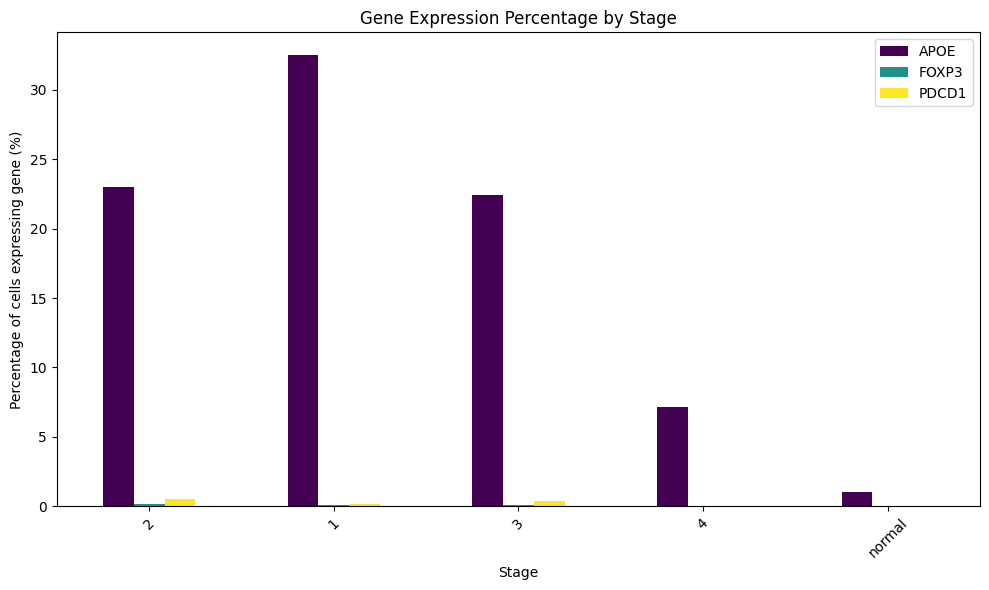

In [147]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# 관심 있는 유전자 목록
genes = ['APOE', 'FOXP3','PDCD1']

# 'stage' 순서를 명시적으로 지정
ccRCC2.obs['stage'] = pd.Categorical(ccRCC2.obs['stage'], categories=['normal', '1', '2', '3', '4'], ordered=True)

# 유전자 발현이 0보다 큰 셀의 비율 계산
percentage_data = {}
for gene in genes:
    # 유전자 발현이 0보다 큰 셀을 찾기 (X 속성 사용)
    expression = ccRCC2[:, gene].X > 0
    # 각 stage 별로 비율 계산
    gene_percentage = {}
    for stage in ccRCC2.obs['stage'].unique():
        stage_mask = ccRCC2.obs['stage'] == stage
        percentage = np.sum(expression[stage_mask]) / np.sum(stage_mask) * 100  # 비율 계산
        gene_percentage[stage] = percentage
    percentage_data[gene] = gene_percentage

# 결과를 DataFrame으로 변환
percentage_df = pd.DataFrame(percentage_data)

# Bar Plot으로 시각화
percentage_df.plot(kind='bar', figsize=(10, 6), colormap='viridis')
plt.title('Gene Expression Percentage by Stage')
plt.ylabel('Percentage of cells expressing gene (%)')
plt.xlabel('Stage')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


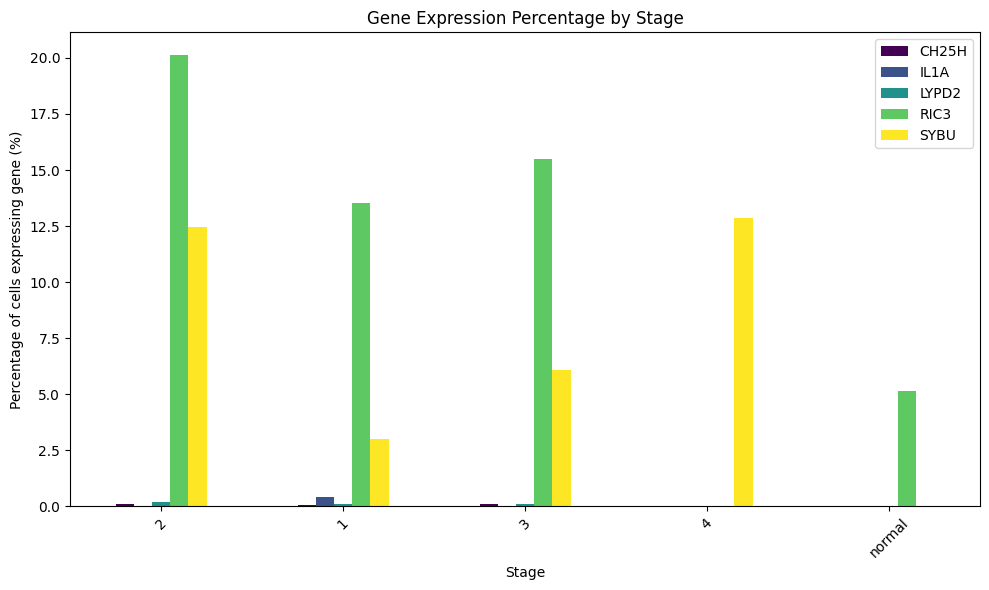

Stage per gene expression percentage:
           CH25H      IL1A     LYPD2       RIC3       SYBU
2       0.089686  0.000000  0.179372  20.134529  12.466368
1       0.043687  0.436872  0.087374  13.543032   3.014417
3       0.121951  0.000000  0.121951  15.487805   6.097561
4       0.000000  0.000000  0.000000   0.000000  12.857143
normal  0.000000  0.000000  0.000000   5.154639   0.000000


In [152]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# 관심 있는 유전자 목록
genes = ['CH25H', 'IL1A', 'LYPD2', 'RIC3', 'SYBU']

# 'stage' 순서를 명시적으로 지정
ccRCC2.obs['stage'] = pd.Categorical(ccRCC2.obs['stage'], categories=['normal', '1', '2', '3', '4'], ordered=True)

# 유전자 발현이 0보다 큰 셀의 비율 계산
percentage_data = {}
for gene in genes:
    # 유전자 발현이 0보다 큰 셀을 찾기 (X 속성 사용)
    expression = ccRCC2[:, gene].X > 0
    # 각 stage 별로 비율 계산
    gene_percentage = {}
    for stage in ccRCC2.obs['stage'].unique():
        stage_mask = ccRCC2.obs['stage'] == stage
        percentage = np.sum(expression[stage_mask]) / np.sum(stage_mask) * 100  # 비율 계산
        gene_percentage[stage] = percentage
    percentage_data[gene] = gene_percentage

# 결과를 DataFrame으로 변환
percentage_df = pd.DataFrame(percentage_data)

# Bar Plot으로 시각화
percentage_df.plot(kind='bar', figsize=(10, 6), colormap='viridis')
plt.title('Gene Expression Percentage by Stage')
plt.ylabel('Percentage of cells expressing gene (%)')
plt.xlabel('Stage')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# DataFrame 출력
print("Stage per gene expression percentage:")
print(percentage_df)


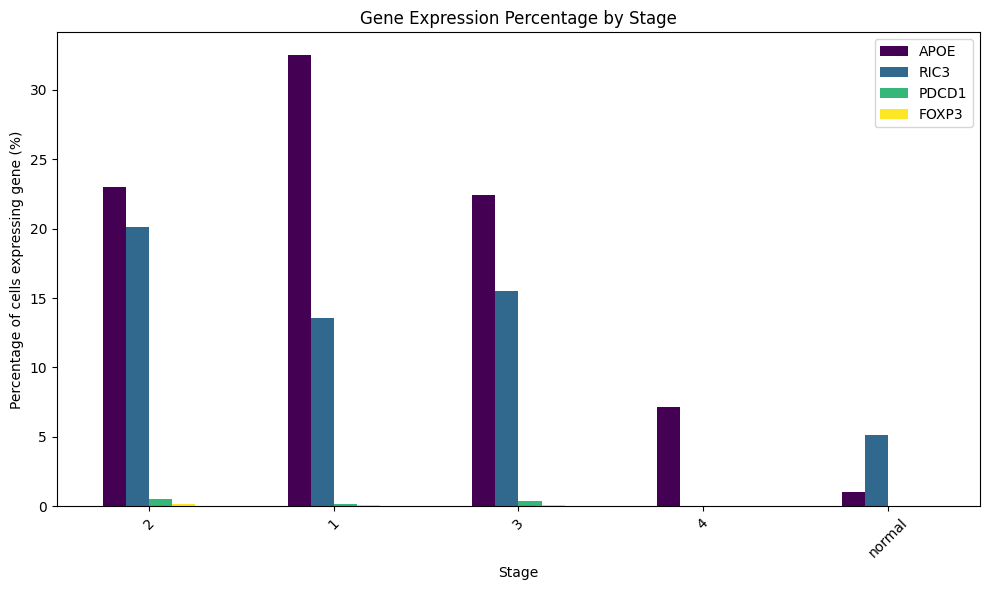

Stage per gene expression percentage:
             APOE       RIC3     PDCD1     FOXP3
2       22.959641  20.134529  0.538117  0.179372
1       32.503277  13.543032  0.174749  0.131062
3       22.439024  15.487805  0.365854  0.121951
4        7.142857   0.000000  0.000000  0.000000
normal   1.030928   5.154639  0.000000  0.000000


In [150]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# 관심 있는 유전자 목록
genes = ['APOE', 'RIC3', 'PDCD1', 'FOXP3']

# 'stage' 순서를 명시적으로 지정
ccRCC2.obs['stage'] = pd.Categorical(ccRCC2.obs['stage'], categories=['normal', '1', '2', '3', '4'], ordered=True)

# 유전자 발현이 0보다 큰 셀의 비율 계산
percentage_data = {}
for gene in genes:
    # 유전자 발현이 0보다 큰 셀을 찾기 (X 속성 사용)
    expression = ccRCC2[:, gene].X > 0
    # 각 stage 별로 비율 계산
    gene_percentage = {}
    for stage in ccRCC2.obs['stage'].unique():
        stage_mask = ccRCC2.obs['stage'] == stage
        percentage = np.sum(expression[stage_mask]) / np.sum(stage_mask) * 100  # 비율 계산
        gene_percentage[stage] = percentage
    percentage_data[gene] = gene_percentage

# 결과를 DataFrame으로 변환
percentage_df = pd.DataFrame(percentage_data)

# Bar Plot으로 시각화
percentage_df.plot(kind='bar', figsize=(10, 6), colormap='viridis')
plt.title('Gene Expression Percentage by Stage')
plt.ylabel('Percentage of cells expressing gene (%)')
plt.xlabel('Stage')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# DataFrame 출력
print("Stage per gene expression percentage:")
print(percentage_df)


In [134]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

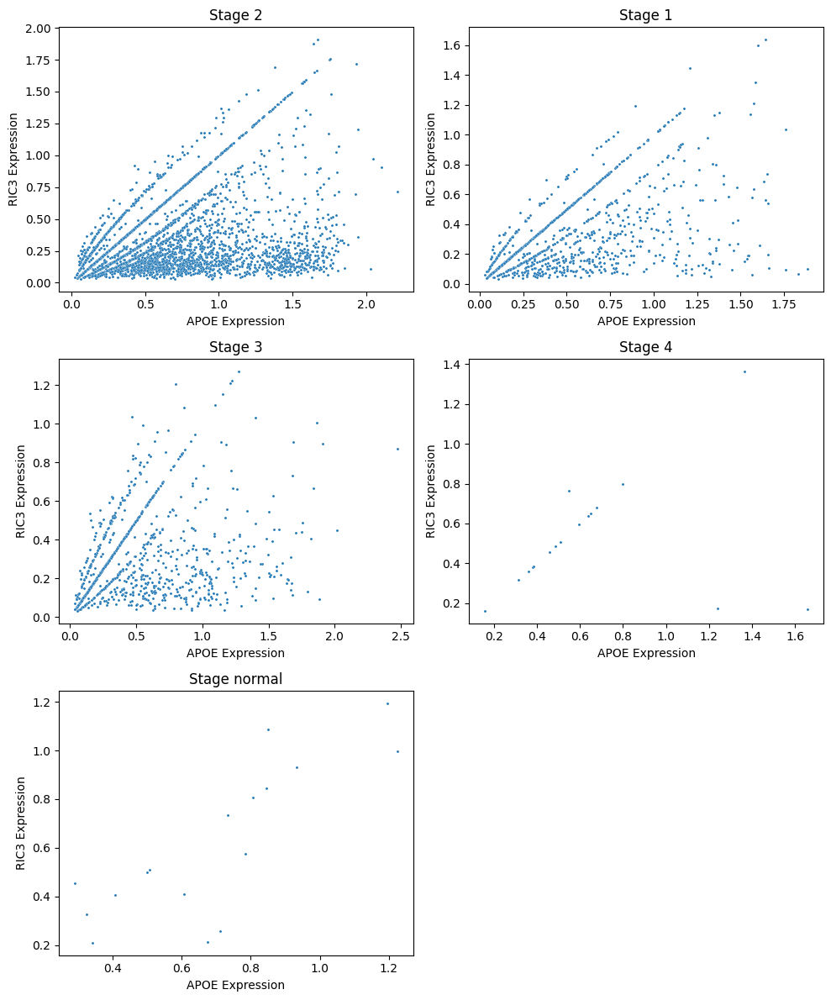

    Stage  Pearson Correlation        p-value
0       2             0.355414  2.988628e-131
1       1             0.529544   1.107821e-82
2       3             0.278972   2.670342e-18
3       4             0.236737   3.602743e-01
4  normal             0.809019   8.400133e-05


In [138]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
import math

# APOE와 RIC3 발현 데이터 추출
apoe_expression = ccRCC2[:, 'APOE'].X.toarray().flatten()
ric3_expression = ccRCC2[:, 'RIC3'].X.toarray().flatten()

# Stage 정보를 가져옵니다.
stages = ccRCC2.obs['stage'].values

# 각 stage별로 처리
unique_stages = stages.unique()

# Pearson 상관 계수와 p-value를 저장할 리스트
results = []

# 서브플롯 행과 열 계산 (최대 4개씩 한 행에 배치)
n_stages = len(unique_stages)
n_cols = 2  # 한 행에 2개의 플롯
n_rows = math.ceil(n_stages / n_cols)

# 서브플롯 설정
fig, axes = plt.subplots(n_rows, n_cols, figsize=(10, n_rows * 4))
axes = axes.flatten()

for idx, stage in enumerate(unique_stages):
    # 해당 stage의 데이터만 필터링
    stage_filter = (stages == stage)
    
    # APOE와 RIC3 발현 데이터 필터링 (0이 아닌 값만)
    stage_apoe_expression = apoe_expression[stage_filter]
    stage_ric3_expression = ric3_expression[stage_filter]
    
    # 0이 아닌 값만 필터링
    non_zero_filter = (stage_apoe_expression > 0) & (stage_ric3_expression > 0)
    
    # 필터링된 데이터로 DataFrame 생성
    correlation_df = pd.DataFrame({
        'APOE': stage_apoe_expression[non_zero_filter],
        'RIC3': stage_ric3_expression[non_zero_filter]
    })
    
    # Pearson 상관 계수와 p-value 계산
    if len(correlation_df) > 1:  # 두 변수의 상관 관계를 계산할 데이터가 충분한지 확인
        corr, p_value = pearsonr(correlation_df['APOE'], correlation_df['RIC3'])
        results.append({'Stage': stage, 'Pearson Correlation': corr, 'p-value': p_value})
    else:
        results.append({'Stage': stage, 'Pearson Correlation': None, 'p-value': None})
    
    # 산점도 그리기
    sns.scatterplot(
        x='APOE', 
        y='RIC3', 
        data=correlation_df, 
        s=5, 
        ax=axes[idx]
    )
    # 제목과 레이블 설정
    axes[idx].set_title(f'Stage {stage}', fontsize=12)
    axes[idx].set_xlabel('APOE Expression', fontsize=10)
    axes[idx].set_ylabel('RIC3 Expression', fontsize=10)

# 빈 서브플롯 숨기기 (unique_stages의 개수보다 서브플롯이 많을 경우)
for ax in axes[len(unique_stages):]:
    ax.axis('off')

# 레이아웃 조정
plt.tight_layout()
plt.show()

# Pearson 결과를 데이터프레임으로 출력
results_df = pd.DataFrame(results)
print(results_df)


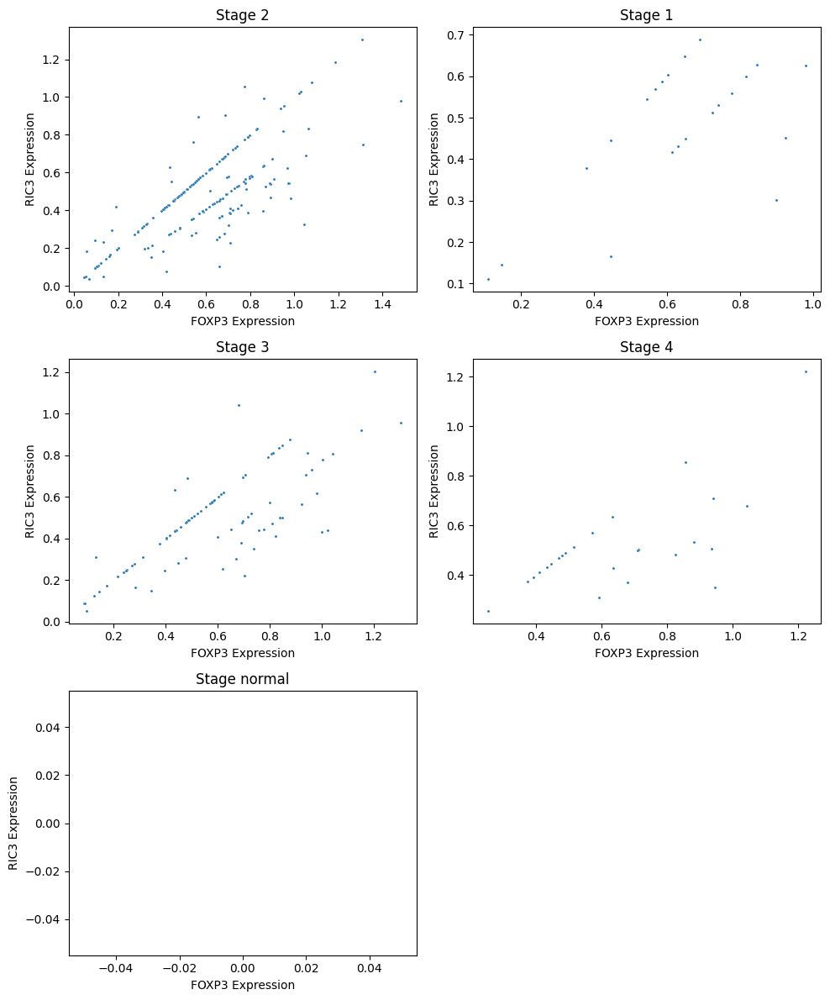

    Stage  Pearson Correlation       p-value
0       2             0.764129  1.102916e-36
1       1             0.653488  9.736864e-04
2       3             0.776608  9.673220e-19
3       4             0.688230  1.430692e-04
4  normal                  NaN           NaN


In [139]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
import math

# APOE와 RIC3 발현 데이터 추출
apoe_expression = ccRCC2[:, 'FOXP3'].X.toarray().flatten()
ric3_expression = ccRCC2[:, 'RIC3'].X.toarray().flatten()

# Stage 정보를 가져옵니다.
stages = ccRCC2.obs['stage'].values

# 각 stage별로 처리
unique_stages = stages.unique()

# Pearson 상관 계수와 p-value를 저장할 리스트
results = []

# 서브플롯 행과 열 계산 (최대 4개씩 한 행에 배치)
n_stages = len(unique_stages)
n_cols = 2  # 한 행에 2개의 플롯
n_rows = math.ceil(n_stages / n_cols)

# 서브플롯 설정
fig, axes = plt.subplots(n_rows, n_cols, figsize=(10, n_rows * 4))
axes = axes.flatten()

for idx, stage in enumerate(unique_stages):
    # 해당 stage의 데이터만 필터링
    stage_filter = (stages == stage)
    
    # APOE와 RIC3 발현 데이터 필터링 (0이 아닌 값만)
    stage_apoe_expression = apoe_expression[stage_filter]
    stage_ric3_expression = ric3_expression[stage_filter]
    
    # 0이 아닌 값만 필터링
    non_zero_filter = (stage_apoe_expression > 0) & (stage_ric3_expression > 0)
    
    # 필터링된 데이터로 DataFrame 생성
    correlation_df = pd.DataFrame({
        'FOXP3': stage_apoe_expression[non_zero_filter],
        'RIC3': stage_ric3_expression[non_zero_filter]
    })
    
    # Pearson 상관 계수와 p-value 계산
    if len(correlation_df) > 1:  # 두 변수의 상관 관계를 계산할 데이터가 충분한지 확인
        corr, p_value = pearsonr(correlation_df['FOXP3'], correlation_df['RIC3'])
        results.append({'Stage': stage, 'Pearson Correlation': corr, 'p-value': p_value})
    else:
        results.append({'Stage': stage, 'Pearson Correlation': None, 'p-value': None})
    
    # 산점도 그리기
    sns.scatterplot(
        x='FOXP3', 
        y='RIC3', 
        data=correlation_df, 
        s=5, 
        ax=axes[idx]
    )
    # 제목과 레이블 설정
    axes[idx].set_title(f'Stage {stage}', fontsize=12)
    axes[idx].set_xlabel('FOXP3 Expression', fontsize=10)
    axes[idx].set_ylabel('RIC3 Expression', fontsize=10)

# 빈 서브플롯 숨기기 (unique_stages의 개수보다 서브플롯이 많을 경우)
for ax in axes[len(unique_stages):]:
    ax.axis('off')

# 레이아웃 조정
plt.tight_layout()
plt.show()

# Pearson 결과를 데이터프레임으로 출력
results_df = pd.DataFrame(results)
print(results_df)


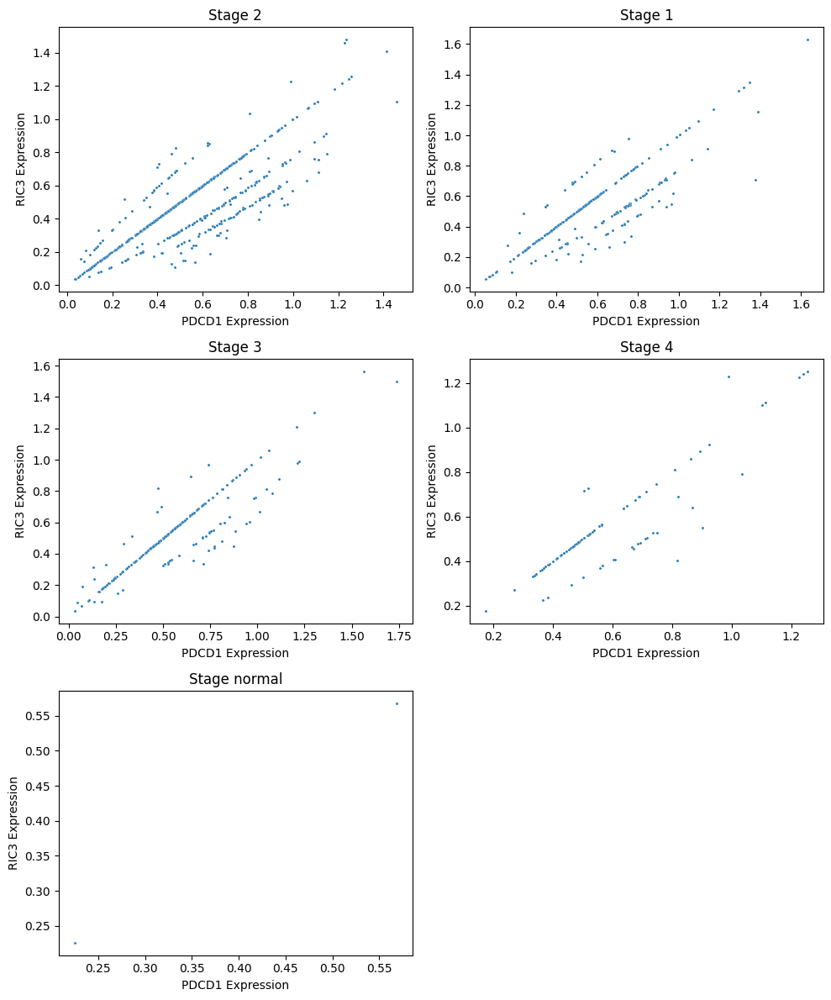

    Stage  Pearson Correlation        p-value
0       2             0.829399  3.284372e-143
1       1             0.832287   3.358645e-64
2       3             0.902350   2.867676e-70
3       4             0.886940   6.252781e-31
4  normal             1.000000   1.000000e+00


In [140]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
import math

# APOE와 RIC3 발현 데이터 추출
apoe_expression = ccRCC2[:, 'PDCD1'].X.toarray().flatten()
ric3_expression = ccRCC2[:, 'RIC3'].X.toarray().flatten()

# Stage 정보를 가져옵니다.
stages = ccRCC2.obs['stage'].values

# 각 stage별로 처리
unique_stages = stages.unique()

# Pearson 상관 계수와 p-value를 저장할 리스트
results = []

# 서브플롯 행과 열 계산 (최대 4개씩 한 행에 배치)
n_stages = len(unique_stages)
n_cols = 2  # 한 행에 2개의 플롯
n_rows = math.ceil(n_stages / n_cols)

# 서브플롯 설정
fig, axes = plt.subplots(n_rows, n_cols, figsize=(10, n_rows * 4))
axes = axes.flatten()

for idx, stage in enumerate(unique_stages):
    # 해당 stage의 데이터만 필터링
    stage_filter = (stages == stage)
    
    # APOE와 RIC3 발현 데이터 필터링 (0이 아닌 값만)
    stage_apoe_expression = apoe_expression[stage_filter]
    stage_ric3_expression = ric3_expression[stage_filter]
    
    # 0이 아닌 값만 필터링
    non_zero_filter = (stage_apoe_expression > 0) & (stage_ric3_expression > 0)
    
    # 필터링된 데이터로 DataFrame 생성
    correlation_df = pd.DataFrame({
        'PDCD1': stage_apoe_expression[non_zero_filter],
        'RIC3': stage_ric3_expression[non_zero_filter]
    })
    
    # Pearson 상관 계수와 p-value 계산
    if len(correlation_df) > 1:  # 두 변수의 상관 관계를 계산할 데이터가 충분한지 확인
        corr, p_value = pearsonr(correlation_df['PDCD1'], correlation_df['RIC3'])
        results.append({'Stage': stage, 'Pearson Correlation': corr, 'p-value': p_value})
    else:
        results.append({'Stage': stage, 'Pearson Correlation': None, 'p-value': None})
    
    # 산점도 그리기
    sns.scatterplot(
        x='PDCD1', 
        y='RIC3', 
        data=correlation_df, 
        s=5, 
        ax=axes[idx]
    )
    # 제목과 레이블 설정
    axes[idx].set_title(f'Stage {stage}', fontsize=12)
    axes[idx].set_xlabel('PDCD1 Expression', fontsize=10)
    axes[idx].set_ylabel('RIC3 Expression', fontsize=10)

# 빈 서브플롯 숨기기 (unique_stages의 개수보다 서브플롯이 많을 경우)
for ax in axes[len(unique_stages):]:
    ax.axis('off')

# 레이아웃 조정
plt.tight_layout()
plt.show()

# Pearson 결과를 데이터프레임으로 출력
results_df = pd.DataFrame(results)
print(results_df)


In [221]:
import PyWGCNA
import scanpy as sc
import pandas as pd


# ccRCC2_object.h5ad 파일 불러오기
adata = sc.read('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC2_object.h5ad')

# 유전자 발현 데이터 추출
expr_matrix = adata.X

# pandas DataFrame으로 변환
# adata.var_names: 유전자 이름, adata.obs_names: 샘플 이름
expr_df = pd.DataFrame(expr_matrix, columns=adata.var_names, index=adata.obs_names)

# CSV 파일로 저장
expr_df.to_csv('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC_expression.csv')

# 저장된 데이터 확인 (상위 5개 행)
print(expr_df.head(5))


                          SAMD11     ISG15      AGRN  TNFRSF18  TNFRSF4  \
RCC81_AACAACCTCATACAGC-1     0.0  0.145564  0.145564       0.0      0.0   
RCC81_AACCTTTCAGTATGAA-1     0.0  0.448542  0.373507       0.0      0.0   
RCC81_AACCTTTTCTCAGGCG-1     0.0  0.000000  0.000000       0.0      0.0   
RCC81_AAGCGTTGTACAGTTC-1     0.0  0.000000  0.234162       0.0      0.0   
RCC81_AAGTACCTCCAGTTCC-1     0.0  0.723579  0.000000       0.0      0.0   

                              VWA1    ATAD3C     PLCH2  HES5  ARHGEF16  ...  \
RCC81_AACAACCTCATACAGC-1  0.000000  0.000000  0.000000   0.0  0.000000  ...   
RCC81_AACCTTTCAGTATGAA-1  0.000000  0.107244  0.107244   0.0  0.204092  ...   
RCC81_AACCTTTTCTCAGGCG-1  0.269655  0.000000  0.000000   0.0  0.000000  ...   
RCC81_AAGCGTTGTACAGTTC-1  0.234162  0.000000  0.234162   0.0  0.234162  ...   
RCC81_AAGTACCTCCAGTTCC-1  0.303014  0.000000  0.000000   0.0  0.000000  ...   

                             PDE9A     U2AF1  SIK1  PWP2   COL18A1    COL6

In [193]:
import PyWGCNA

# 유전자 발현 데이터 경로
geneExp = '/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC_expression.csv'

# PyWGCNA 객체 생성
pyWGCNA_5xFAD = PyWGCNA.WGCNA(
    name='ccRCC',                       # 실험명 (모를 경우 임의로 지정)
    species='homo sapiens',             # 종 (사람)
    geneExpPath=geneExp,                # 유전자 발현 데이터 경로
    outputPath='',                      # 결과 저장 경로 (저장하지 않으려면 빈 문자열)
    save=False                          # 분석 결과 저장 여부 (저장하지 않으려면 False)
)

# 유전자 발현 데이터 확인
print(pyWGCNA_ccRCC.geneExpr.to_df().head(5))  # 상위 5개의 데이터 출력


                          SAMD11     ISG15      AGRN  TNFRSF18  TNFRSF4  \
RCC81_AACAACCTCATACAGC-1     0.0  0.145564  0.145564       0.0      0.0   
RCC81_AACCTTTCAGTATGAA-1     0.0  0.448542  0.373507       0.0      0.0   
RCC81_AACCTTTTCTCAGGCG-1     0.0  0.000000  0.000000       0.0      0.0   
RCC81_AAGCGTTGTACAGTTC-1     0.0  0.000000  0.234162       0.0      0.0   
RCC81_AAGTACCTCCAGTTCC-1     0.0  0.723579  0.000000       0.0      0.0   

                              VWA1    ATAD3C     PLCH2  HES5  ARHGEF16  ...  \
RCC81_AACAACCTCATACAGC-1  0.000000  0.000000  0.000000   0.0  0.000000  ...   
RCC81_AACCTTTCAGTATGAA-1  0.000000  0.107244  0.107244   0.0  0.204092  ...   
RCC81_AACCTTTTCTCAGGCG-1  0.269655  0.000000  0.000000   0.0  0.000000  ...   
RCC81_AAGCGTTGTACAGTTC-1  0.234162  0.000000  0.234162   0.0  0.234162  ...   
RCC81_AAGTACCTCCAGTTCC-1  0.303014  0.000000  0.000000   0.0  0.000000  ...   

                             PDE9A     U2AF1  SIK1  PWP2   COL18A1    COL6

Pre-processing...
	Detecting genes and samples with too many missing values...
	Done pre-processing..



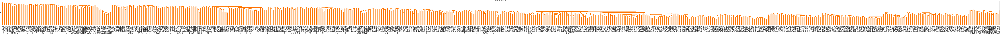

In [194]:
pyWGCNA_5xFAD.preprocess()

Run WGCNA...
pickSoftThreshold: calculating connectivity for given powers...
will use block size  2098
    Power  SFT.R.sq     slope truncated R.sq    mean(k)  median(k)      max(k)
0       1  0.670971 -2.274211        0.98755  31.560824  27.941741  107.245538
1       2  0.918502 -2.332802       0.964655   2.483895   1.407789   25.142309
2       3  0.928514 -1.777875       0.916235   0.397275   0.111118    8.712297
3       4  0.902745 -1.556832       0.876202    0.10742   0.011964    5.079243
4       5  0.931944 -1.449575       0.917953   0.041394   0.001479    3.443661
5       6  0.311961 -2.201042       0.135705   0.020126   0.000211    2.492107
6       7  0.375932 -1.730088       0.251438    0.01139   0.000033     1.87428
7       8  0.288498 -1.849493       0.088271   0.007119   0.000005    1.443835
8       9  0.288394 -1.353993        0.14252   0.004753   0.000001    1.129886
9      10  0.248375 -1.564172       0.061033    0.00332        0.0    0.893863
10     11  0.255858 -1.53761

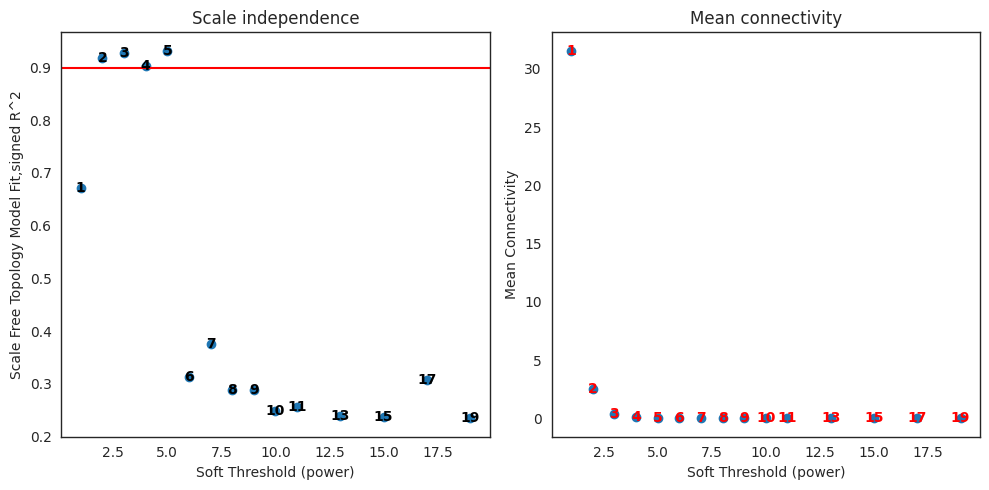

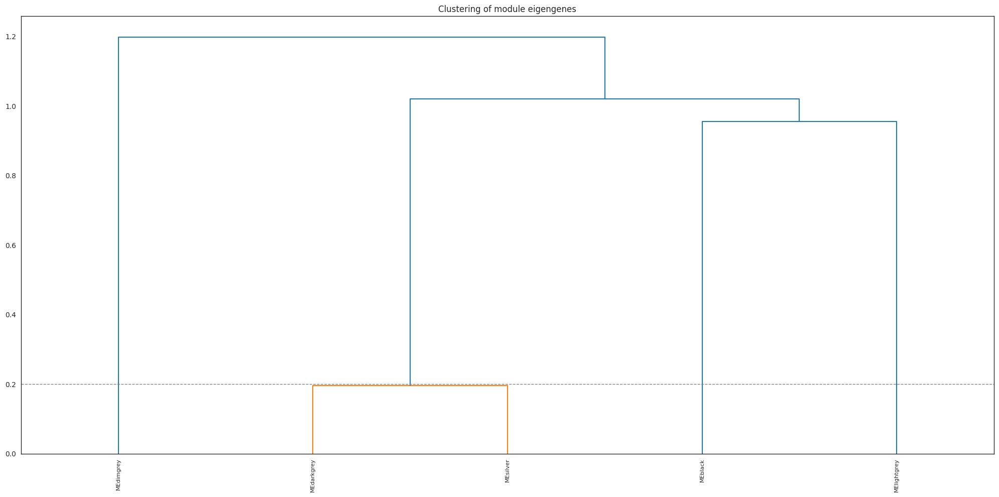

In [195]:
pyWGCNA_5xFAD.findModules()

In [205]:
# adata.obs에서 stage 컬럼을 sampleInfo에 맞게 매핑
sample_info = adata.obs['stage'].astype(str)

# 이후 sampleInfo.csv를 업데이트하고, pyWGCNA에서 적용할 수 있도록 함


# csv로 저장
sample_info.to_csv('/home/Data_Drive_8TB_3/kykim/ccRCC/sampleInfo.csv', index_label='sample_id')

In [206]:
pyWGCNA_5xFAD.updateSampleInfo(path='/home/Data_Drive_8TB_3/kykim/ccRCC/sampleInfo.csv', sep=',')

pyWGCNA_ccRCC.setMetadataColor('stage', {
    'normal': 'gray',  # normal 값에 대한 색상 설정
    '1': 'green',      # stage 1에 대한 색상
    '2': 'blue',       # stage 2에 대한 색상
    '3': 'red',        # stage 3에 대한 색상
    '4': 'purple'      # stage 4에 대한 색상
})

Metadata column stage not found!


In [204]:
print(sample_info.head())

                         stage
RCC81_AACAACCTCATACAGC-1     2
RCC81_AACCTTTCAGTATGAA-1     2
RCC81_AACCTTTTCTCAGGCG-1     2
RCC81_AAGCGTTGTACAGTTC-1     2
RCC81_AAGTACCTCCAGTTCC-1     2


In [201]:
print(adata.obs.columns)

Index(['patient', 'stage', 'exp', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts',
       'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes',
       'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes',
       'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt',
       'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo',
       'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb',
       'doublet_score', 'predicted_doublet', 'leiden', 'cell_type',
       'cnv_leiden', 'cnv_score', 'cnv_status', 'crg_score', 'hilpda_score',
       'hypoxia_score'],
      dtype='object')


Analysing WGCNA...
Calculating module trait relationship ...
	Done..

Adding (signed) eigengene-based connectivity (module membership) ...
	Done..



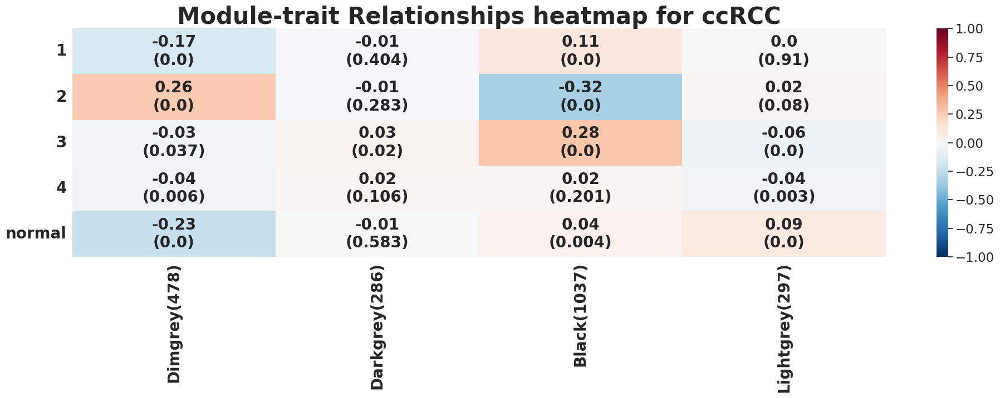

In [207]:
pyWGCNA_5xFAD.analyseWGCNA()

In [208]:

pyWGCNA_5xFAD.top_n_hub_genes(moduleName="coral", n=10)

Module name does not exist in 


Saving data to be True, checking requirements ...
Figure directory does not exist!
Creating figure directory!
Pre-processing...
	Detecting genes and samples with too many missing values...
	Done pre-processing..

Run WGCNA...
pickSoftThreshold: calculating connectivity for given powers...
will use block size  2098
    Power  SFT.R.sq     slope truncated R.sq    mean(k)  median(k)      max(k)
0       1  0.670971 -2.274211        0.98755  31.560824  27.941741  107.245538
1       2  0.918502 -2.332802       0.964655   2.483895   1.407789   25.142309
2       3  0.928514 -1.777875       0.916235   0.397275   0.111118    8.712297
3       4  0.902745 -1.556832       0.876202    0.10742   0.011964    5.079243
4       5  0.931944 -1.449575       0.917953   0.041394   0.001479    3.443661
5       6  0.311961 -2.201042       0.135705   0.020126   0.000211    2.492107
6       7  0.375932 -1.730088       0.251438    0.01139   0.000033     1.87428
7       8  0.288498 -1.849493       0.088271   0.007

AttributeError: 'WGCNA' object has no attribute 'plotNetwork'

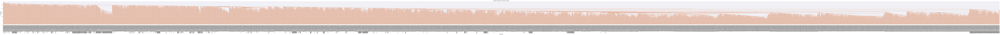

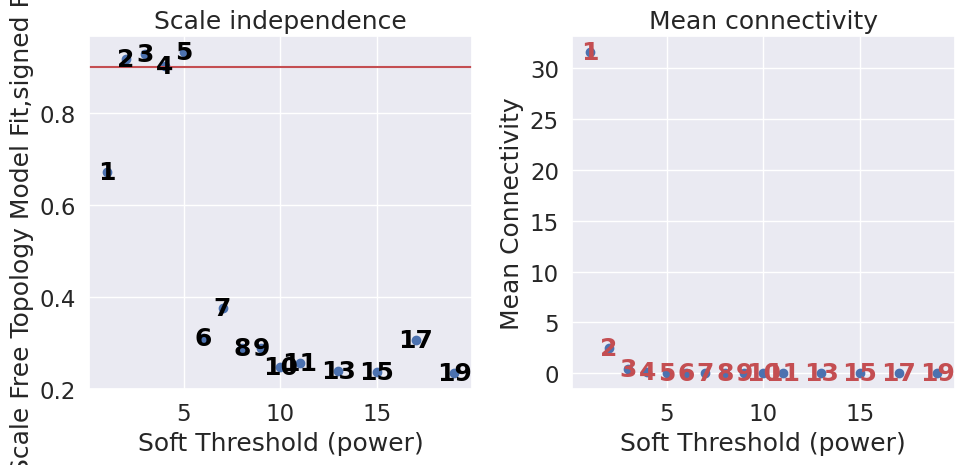

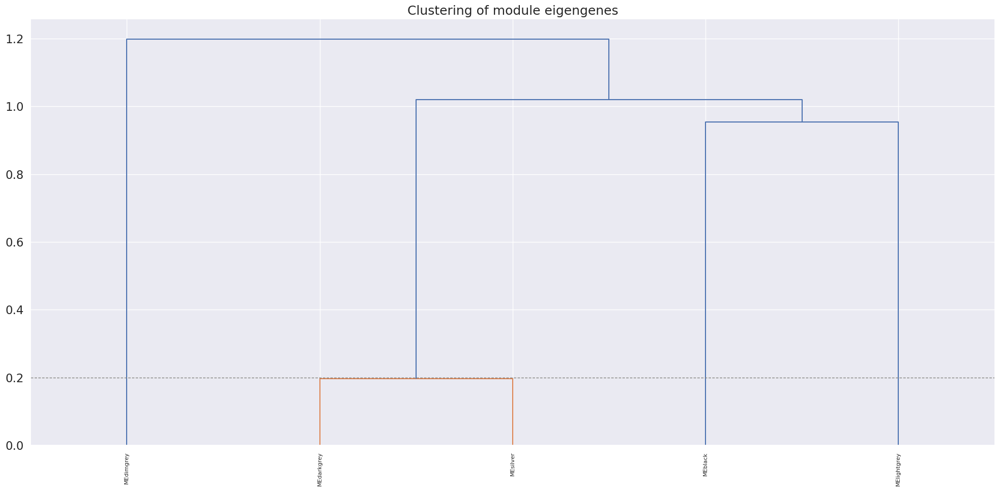

In [210]:
import PyWGCNA
import scanpy as sc
import pandas as pd

# 데이터를 불러옵니다.
adata = sc.read('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC2_object.h5ad')

# 유전자 발현 행렬 (adata.X) 추출, 이를 DataFrame으로 변환
expr_matrix = adata.X  # 이미 numpy.ndarray 형식일 경우
expr_df = pd.DataFrame(expr_matrix, columns=adata.var_names, index=adata.obs_names)

# CSV 파일로 저장
expr_df.to_csv('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC_expression.csv')
geneExp = '/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC_expression.csv'

pyWGCNA_ccRCC = PyWGCNA.WGCNA(
    name='ccRCC',                       # 실험명 또는 분석 이름
    species='Homo sapiens',             # 사람 데이터
    geneExpPath=geneExp,                # 유전자 발현 데이터 경로
    outputPath='/home/Data_Drive_8TB_3/kykim/ccRCC/output/',  # 결과 저장 경로
    save=True                           # 분석 결과 저장 여부
)
# 샘플 정보 파일을 준비 (예시로 stage 정보를 추가)
# 예시: sampleInfo.csv 파일에는 stage 컬럼이 포함되어 있어야 합니다.

pyWGCNA_ccRCC.updateSampleInfo(path='/home/Data_Drive_8TB_3/kykim/ccRCC/sampleInfo.csv', sep=',')

# 메타데이터 컬럼의 색상 지정 (예시로 stage 컬럼에 색상 지정)
pyWGCNA_ccRCC.setMetadataColor('stage', {
    'normal': 'gray',  # normal 값에 대한 색상 설정
    '1': 'green',      # stage 1에 대한 색상
    '2': 'blue',       # stage 2에 대한 색상
    '3': 'red',        # stage 3에 대한 색상
    '4': 'purple'      # stage 4에 대한 색상
})
# WGCNA 분석 실행
pyWGCNA_ccRCC.runWGCNA()

# 분석 결과 출력
pyWGCNA_ccRCC.plotNetwork()


In [211]:
import scanpy as sc
adata = sc.read('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC2_object.h5ad')

# 유전자 발현 데이터 저장
adata.to_df().to_csv('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC_expression.csv', sep=',')

In [228]:
import scanpy as sc
adata = sc.read_h5ad('/home/Data_Drive_8TB_3/kykim/ccRCC/final_merge.h5ad')
print(adata.shape)  # adata.shape는 튜플 형태로 출력됩니다.

(244687, 14073)


In [229]:
import scanpy as sc
ccadata = sc.read('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC2_object.h5ad')

In [230]:
# Eadata와 adata의 공통 인덱스 찾기
common_obs_indices = ccadata.obs.index.intersection(adata.obs.index)

# Eadata의 var_names를 기준으로 adata의 데이터를 정렬 및 재구성
common_var_names = ccadata.var_names.intersection(adata.var_names)

# adata를 Eadata의 구조에 맞게 재구성
adata_aligned = adata[common_obs_indices, common_var_names].copy()

# Eadata의 var_names 순서에 맞게 정렬
adata_aligned = adata_aligned[:, ccadata.var_names].copy()

# Eadata의 .X에 adata의 데이터를 반영
Eadata_updated = ccadata.copy()
Eadata_updated[common_obs_indices].X = adata_aligned.X.copy()

print("Eadata.X가 adata.X로 성공적으로 업데이트되었습니다.")


Eadata.X가 adata.X로 성공적으로 업데이트되었습니다.


In [248]:
ccadata.obs

,patient,stage,exp,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,...,doublet_score,predicted_doublet,leiden,cell_type,cnv_leiden,cnv_score,cnv_status,crg_score,hilpda_score,hypoxia_score
RCC81_AACAACCTCATACAGC-1,RCC81,2,ccRCC,4670,8.449128,24379.0,10.101518,28.549161,39.041798,50.514787,...,0.082581,False,ccRCCccRCC2,Epithelial,20,0.018805,tumor,0.222746,0.643766,0.871619
RCC81_AACCTTTCAGTATGAA-1,RCC81,2,ccRCC,5469,8.607034,33744.0,10.426588,25.237079,36.086415,48.453058,...,0.043643,False,ccRCCccRCC2,Epithelial,37,0.012906,tumor,0.196426,0.567100,1.102069
RCC81_AACCTTTTCTCAGGCG-1,RCC81,2,ccRCC,3234,8.081784,12342.0,9.420844,31.931616,42.391833,53.589370,...,0.040725,False,ccRCCccRCC2,Epithelial,15,0.018060,tumor,0.074420,0.475243,0.608049
RCC81_AAGCGTTGTACAGTTC-1,RCC81,2,ccRCC,3461,8.149602,14478.0,9.580455,31.585854,43.327808,54.876364,...,0.047240,False,ccRCCccRCC2,Epithelial,15,0.018060,tumor,0.205929,0.372824,0.995189
RCC81_AAGTACCTCCAGTTCC-1,RCC81,2,ccRCC,3068,8.029107,10793.0,9.286746,31.853979,42.536829,53.173353,...,0.032440,False,ccRCCccRCC2,Epithelial,24,0.022171,tumor,0.089903,-0.017867,0.745414
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GSM6415694_N2_TTACGTTGTTCCGTTC.1,N2,normal,GSM,521,6.257668,908.0,6.812345,45.044053,53.634361,64.647577,...,0.019076,False,ccRCCccRCC2,Epithelial,3,0.015402,tumor,0.061352,-0.231002,0.320103
GSM6415694_N2_TTATTGCGTATACCCA.1,N2,normal,GSM,468,6.150603,1000.0,6.908755,54.600000,63.200000,73.200000,...,0.014288,False,ccRCCccRCC2,Epithelial,3,0.015402,tumor,0.074417,-0.180623,0.758471
GSM6415694_N2_TTGCCTGTCTCAACGA.1,N2,normal,GSM,808,6.695799,1853.0,7.525101,51.484080,58.014031,67.188343,...,0.017663,False,ccRCCccRCC2,Epithelial,14,0.015643,tumor,0.094945,-0.161627,0.510002
GSM6415694_N2_TTTACGTAGTTACTCG.1,N2,normal,GSM,836,6.729824,1602.0,7.379632,42.571785,49.812734,60.299625,...,0.029618,False,ccRCCccRCC2,Epithelial,35,0.005379,tumor,0.057890,-0.198940,0.066018


In [233]:
save_path = "/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Immune_Deconvolution/scenic.h5ad"

# AnnData 객체 저장
Eadata_updated.write(save_path)

In [234]:
Eadata_updated.to_df().to_csv('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC_expression.csv', sep=',')

In [239]:
save_path = "/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Immune_Deconvolution/scenic.h5ad"


In [249]:
adata = Eadata_updated

In [43]:
import pandas as pd
import numpy as np
import os, glob
import pickle

from arboreto.utils import load_tf_names
from arboreto.algo import grnboost2

from pyscenic.rnkdb import FeatherRankingDatabase as RankingDatabase
from pyscenic.utils import modules_from_adjacencies
from pyscenic.prune import prune2df, df2regulons
from pyscenic.aucell import aucell

import seaborn as sns

ModuleNotFoundError: No module named 'pyscenic.genesig'